In [1]:
# Activate Multithreading
using IJulia
installkernel("Julia (16 threads)", env = Dict("JULIA_NUM_THREADS"=>"16"))
using Base.Threads
nthreads()

┌ Info: Installing Julia (16 threads) kernelspec in /Users/jeet/Library/Jupyter/kernels/julia-_16-threads_-1.11
└ @ IJulia /Users/jeet/.julia/packages/IJulia/dR0lE/deps/kspec.jl:105


16

In [2]:
include("../functions.jl")
include("../plotting_functions.jl")
using LaTeXStrings
using JLD
using DataStructures
using LinearAlgebra
using Statistics
import Random


In [67]:
# N used for data sent to Laura was N = 10.
# "so" stands for square octagon
# Generate lattice and spin lattice

# N = 85 has 19,996 vertices. This is used for the cluster and for the paper.
# Good numbers are: [3,5, 9, 15, 17, 19, 39]
# Not good numbers are: [13, 33,35,37]
N = 20
@time so_lat_rect_full = get_so_lat_rect(N, oct, paper=true) 
@time so_lat_rect_spin_full, latA, latB, sub_lat, G_to_spin, spin_to_G = get_so_lat_spin(so_lat_rect_full)
# covering = get_perfect_covering(latA, latB,sub_lat, so_lat_rect.nbr )
# config = convering_to_config(covering, so_lat_rect_spin, G_to_spin);

  0.089867 seconds (135.96 k allocations: 116.615 MiB, 7.12% gc time)
  0.055763 seconds (49.61 k allocations: 174.990 MiB, 4.09% gc time)


(Graph(ComplexF64[-30.727922061357848 - 33.64213562373094im, -29.874368670764575 - 33.28858223313766im, -31.58147545195112 - 33.28858223313766im, -32.4350288425444 - 31.93502884254439im, -31.935028842544394 - 32.43502884254439im, -31.58147545195112 - 31.581475451951118im, -32.9350288425444 - 32.43502884254439im, -33.288582233137674 - 31.581475451951118im, -32.4350288425444 - 32.93502884254439im, -33.642135623730944 - 30.727922061357845im  …  29.02081528017131 + 31.935028842544405im, 27.31370849898476 + 33.64213562373095im, 33.642135623730944 + 30.72792206135786im, 33.288582233137674 + 31.581475451951132im, 32.4350288425444 + 32.935028842544405im, 32.9350288425444 + 32.435028842544405im, 31.9350288425444 + 32.435028842544405im, 31.58147545195113 + 33.288582233137674im, 32.4350288425444 + 31.935028842544405im, 30.727922061357855 + 33.64213562373095im], [0 1 … 0 0; 1 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], [[2, 3], [18, 1], [1, 5], [7, 5, 6, 8], [9, 4, 3, 6], [24, 4, 26, 5], [4, 9], [4, 10], 

In [68]:
so_lat_rect = Graph(so_lat_rect_full.pts, fill(0,1,1), Vector{Vector{Int64}}[], so_lat_rect_full.n, so_lat_rect_full.sq_plaq, so_lat_rect_full.oct_plaq,Vector{Vector{Int64}}[] )
so_lat_rect_spin = Graph(so_lat_rect_spin_full.pts, fill(0,1,1), Vector{Vector{Int64}}[], so_lat_rect_spin_full.n, so_lat_rect_spin_full.sq_plaq, so_lat_rect_spin_full.oct_plaq,Vector{Vector{Int64}}[] )
config_vert = get_vert_col_state(so_lat_rect_spin_full, so_lat_rect_full)
config_hori = get_hori_col_state(so_lat_rect_spin_full, so_lat_rect_full)
# @time rand_config = az_randomize_config(1000_000_0, config_hori, az_lat_spin.sq_plaq)
;

In [69]:
save("../data/so-rect/lattice-data-$N.jld","so_lat_rect", so_lat_rect,
     "so_lat_rect_spin", so_lat_rect_spin,
     "config_vert", config_vert, "config_hori", config_hori)

In [70]:
# N = 13
loaded_data = load("../data/so-rect/lattice-data-$N.jld")

so_lat_rect = loaded_data["so_lat_rect"]
so_lat_rect_spin = loaded_data["so_lat_rect_spin"]
# spin_to_G = loaded_data["spin_to_G"]
config_hori = loaded_data["config_hori"]
config_vert = loaded_data["config_vert"]
;

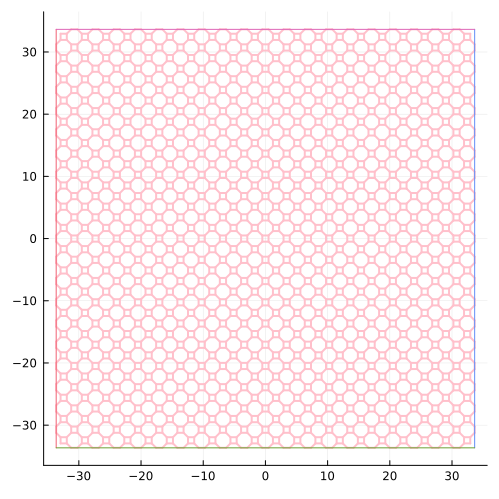

  0.744507 seconds (670.29 k allocations: 39.873 MiB)


In [71]:
# # Plot lattice and vertical/horizontal configuration

p = plot_generate(500)

@time plot_edges(p,so_lat_rect_full)
# config_vert = get_vert_col_state(so_lat_rect_spin, so_lat_rect)
# config_hori = get_hori_col_state(so_lat_rect_spin, so_lat_rect)
# plot_config(p, config_hori,spin_to_G, so_lat_rect)
# plot!(x ., framestyle=:none)
# plot!(xticks=false, yticks=false, framestyle=:none)
cutoff = N - 1/2 + N/sqrt(2) #+ 0.6
y = [i for i in range(minimum(real.(so_lat_rect_full.pts)),maximum(real.(so_lat_rect_full.pts)), length=10)]

x = (cutoff) * ones(length(y))
plot!(x, y)
plot!(-x, y)
plot!(y, x)
plot!(y, -x)
# plot!(xlim=(-14, 14), ylim =(-14, 14))
display(p)

In [72]:
# Randomize configuration

config_vert = get_vert_col_state(so_lat_rect_spin_full, so_lat_rect)
nstep = 1000_000
@time config = randomize_config(nstep, config_vert, so_lat_rect_spin.sq_plaq, so_lat_rect_spin.oct_plaq)
;

  0.015247 seconds (2 allocations: 128 bytes)


  0.000312 seconds (241 allocations: 23.812 KiB)
  0.840622 seconds (670.29 k allocations: 39.873 MiB)


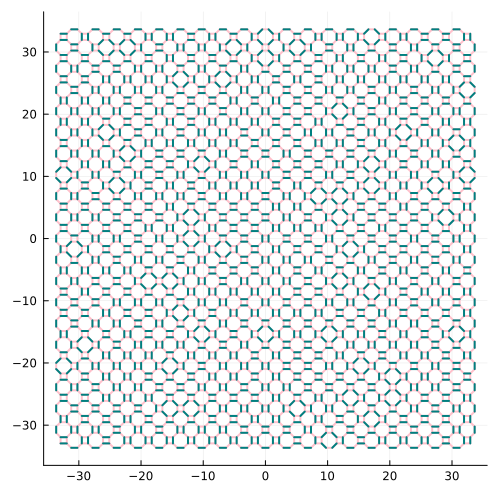

In [73]:
@time p = plot_generate(500)
@time plot_edges(p,so_lat_rect_full)
plot_config(p, config,spin_to_G, so_lat_rect)
display(p)

In [74]:
oct_path =  findall(x -> (abs(imag(x) -0.5 - 0.5/sqrt(2)) < 1e-5 ), so_lat_rect_spin.pts)
oct_path = sort_path_real(oct_path, so_lat_rect_spin)

sq_path = findall(x -> (abs(imag(x)) < 1e-5 ), so_lat_rect_spin.pts)
sq_path = sort_path_real(sq_path, so_lat_rect_spin)

oct_diag_path = findall(x -> (abs(imag(x) + real(x) - 1 - 1/sqrt(2)) < 1e-5 ), so_lat_rect_spin.pts)
oct_diag_path = sort_path_real(oct_diag_path, so_lat_rect_spin)

# line = findall(x -> ( real(x) > 0) && (abs(imag(x)- 0.5 - 0.5/sqrt(2)) < 1e-5 ), so_lat_rect_spin.pts)
# line1 = findall(x -> (abs(imag(x)) < 1e-5 ), so_lat_rect_spin.pts)
# line2 = findall(x -> (abs(imag(x) -0.5 - 0.5/sqrt(2)) < 1e-5 ), so_lat_rect_spin.pts)
# line3 = findall(x -> (abs(imag(x) -real(x)) < 1e-5 ), so_lat_rect_spin.pts)
lines = [oct_path, sq_path, oct_diag_path]
label = [ "Octagon", "Square", "Octagon diagonal"]
origin = length(oct_path) ÷ 2 

20

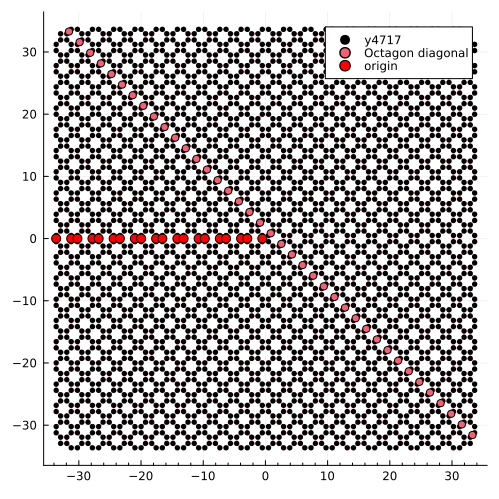

In [75]:
p = plot_generate(500)

plot_edges(p,so_lat_rect_full)


scatter!(p,[real.(so_lat_rect.pts)], [imag.(so_lat_rect.pts)], color=:black, markersize=3)



for i in 3
    line = lines[i]
    scatter!(real.(so_lat_rect_spin.pts[line]),imag.(so_lat_rect_spin.pts[line]), label=label[i])
end


pt = so_lat_rect_spin.pts[sq_path[1:origin]]
scatter!(p,[real(pt)], [imag(pt)], label="origin", color=:red, markersize=5)

plot!(legend=true)
# origin = -1 -1/sqrt(2) + 0.0im
# index_pts(so_lat_rect_spin.pts, origin)
# plot!(ylim=(-2,2), xlim=(-2,2))
# scatter!([origin], [0])
# savefig(p,"./images/rect-square-oct.pdf")
plot!(xminorticks=5)
display(p)

In [76]:
function sample_sz_line(running_sum::Vector{Int64}, config::Vector{Bool}, line::Vector{Int64}, nline::Int64)
    for i in 1:nline
        if @inbounds config[line[i]]
            @inbounds running_sum[i] = running_sum[i] + 1
        end
    end
end

function sample_sz_all(running_sum::Vector{Int64}, config::Vector{Bool}, nspin::Int64)
    for i in 1:nspin
        if @inbounds config[i]
            @inbounds running_sum[i] = running_sum[i] + 1
        end
    end
end

function sample_szsz_line(running_sum::Vector{Int64}, config::Vector{Bool}, line::Vector{Int64}, nline::Int64, origin::Int64)
    if @inbounds config[line[origin]]
        sample_sz_line(running_sum, config, line, nline)
    end
end


function init_vis_sampling(line1, origin::Int64)
    nline = length(line1)
    # origin = (nline + 1) ÷ 2
    line1_vis_right = line1[origin:end]
    line1_vis_left = reverse(line1[1:origin])
    vis_right = fill(0, length(line1_vis_right))
    vis_left = fill(0, length(line1_vis_left))

    return  line1_vis_left, line1_vis_right, length(line1_vis_left), length(line1_vis_right), vis_left, vis_right
end

    
function sample_vis_line(running_sum::Vector{Int64}, config::Vector{Bool}, line::Vector{Int64}, nline::Int64)
    curr_vis = 1
    for i in 1:nline
        if @inbounds config[line[i]]
            curr_vis = -curr_vis
        end
        @inbounds running_sum[i] = running_sum[i] + curr_vis
    end
end



sample_vis_line (generic function with 1 method)

In [77]:
function mc(config::Vector{Bool}, so_lat::Graph, so_lat_spin::Graph, nsample::Int64, nwait::Int64, lines::Vector{Vector{Int64}} )
    nsq = size(so_lat.sq_plaq)[2]
    noct = size(so_lat.oct_plaq)[2]
    nspin = length(config)
    plaq_sq_spin = so_lat_spin.sq_plaq
    plaq_oct_spin = so_lat_spin.oct_plaq
    
    oct_path, sq_path, oct_diag_path = lines
    path_lengths = length.([oct_path, sq_path, oct_diag_path])
    line_origin = length(oct_path) ÷ 2
    
    sz_lines = [fill(0, length(line)) for line in lines]

    szsz_lines = [fill(0, length(line)) for line in lines]

    # Random.seed!(1234)
    # printstyled("Random seed set to 1234. Change this if running on multiple threads.\n";color=:red)

    oct_line_vis_left, oct_line_vis_right, noct_line_vis_left, noct_line_vis_right, oct_vis_left, oct_vis_right = init_vis_sampling(oct_path, line_origin)
    sq1_line_vis_left, sq1_line_vis_right, nsq1_line_vis_left, nsq1_line_vis_right, sq1_vis_left, sq1_vis_right = init_vis_sampling(sq_path, line_origin)
    sq2_line_vis_left, sq2_line_vis_right, nsq2_line_vis_left, nsq2_line_vis_right, sq2_vis_left, sq2_vis_right = init_vis_sampling(sq_path, line_origin+1)
    oct_diag_line_vis_left, oct_diag_line_vis_right, noct_diag_line_vis_left, noct_diag_line_vis_right, oct_diag_vis_left, oct_diag_vis_right = init_vis_sampling(oct_diag_path, line_origin)

    left_lines = [oct_line_vis_left, sq1_line_vis_left, sq2_line_vis_left, oct_diag_line_vis_left]
    right_lines = [oct_line_vis_right, sq1_line_vis_right, sq2_line_vis_right, oct_diag_line_vis_right]
    nleft_lines = [noct_line_vis_left, nsq1_line_vis_left, nsq2_line_vis_left, noct_diag_line_vis_left]
    nright_lines = [noct_line_vis_right, nsq1_line_vis_right, nsq2_line_vis_right, noct_diag_line_vis_right]
    vis_left = [oct_vis_left, sq1_vis_left, sq2_vis_left, oct_diag_vis_left]
    vis_right = [oct_vis_right, sq1_vis_right, sq2_vis_right, oct_diag_vis_right]


    for i in 1:nsample
        for j in 1:nwait
            if rand(Bool)
                plaq_oct_move(config,plaq_oct_spin, noct )
            else
                plaq_sq_move(config,plaq_sq_spin, nsq )
            end
            
            # while !( (plaq_oct_move(config,plaq_oct_spin, noct ) == false) || (plaq_sq_move(config,plaq_sq_spin, nsq ) == false) )
            # end
        end
        # Sample correlators
        
        for i in 1:3
            sample_sz_line(sz_lines[i], config, lines[i], path_lengths[i])
            sample_szsz_line(szsz_lines[i], config, lines[i], path_lengths[i], line_origin)
        end
        for i in 1:4
            sample_vis_line(vis_left[i], config, left_lines[i], nleft_lines[i])
            sample_vis_line(vis_right[i], config, right_lines[i], nright_lines[i])
        end
    end

    correlators = [sz_lines, szsz_lines, vis_left, vis_right] ./ nsample

    return config, correlators
end

mc (generic function with 1 method)

In [78]:
lines = [oct_path, sq_path, oct_diag_path]
# config_vert = get_vert_col_state(so_lat_rect_spin, so_lat_rect)
# config_hori = get_hori_col_state(so_lat_rect_spin, so_lat_rect)
nwait = 1000
nsample = 1000_00
cf = [config_hori, config_vert]
fn = ["./data/so-rect/4line-hori", "./data/so-rect/4line-vert"] .* "del"
nt = 2

# ft = [config_hori]; fn = ["./data/so-rect/4line-hori-del"]; nt = 1
corrs = [[] for _ in 1:length(fn)]

@threads for i in 1:nt
    @time temp, corrs[i] = mc(cf[i], so_lat_rect, so_lat_rect_spin, nsample, nwait, lines)
end

# @time new_config, line1, line2, line3 = mc(config_hori, so_lat_rect, so_lat_rect_spin, nsample, nwait, "./data/so-rect/hori")
# @time new_config, line1, line2, line3 = mc(config_vert, so_lat_rect, so_lat_rect_spin, nsample, nwait, "./data/so-rect/vert")
# szsz_conn = szsz .- sz[2:end]*sz[1];

  1.387867 seconds (449 allocations: 29.719 KiB)
  1.394864 seconds (484 allocations: 34.219 KiB)


In [79]:
save("../data/so-rect/test.jld", "hori_data", corrs[1], "vert_data", corrs[2])

# Data Processing and Plotting

In [80]:
hori_data, vert_data = load("../data/so-rect/test.jld", "hori_data", "vert_data")
# hori_data, vert_data = load("./data/so-rect/10mil.jld", "hori_data", "vert_data")

(Any[[[0.13184, 0.17836, 0.11545, 0.12779, 0.11818, 0.12045, 0.12013, 0.11889, 0.11882, 0.11885  …  0.11931, 0.12038, 0.12264, 0.12231, 0.11961, 0.11596, 0.12618, 0.11753, 0.18346, 0.13698], [0.86816, 0.41535, 0.47826, 0.43438, 0.44399, 0.43936, 0.43968, 0.44053, 0.4406, 0.4382  …  0.44154, 0.44261, 0.44035, 0.43637, 0.43907, 0.44835, 0.43813, 0.47751, 0.41158, 0.86302], [0.11085, 0.16362, 0.11854, 0.12132, 0.11506, 0.12266, 0.12011, 0.11787, 0.12048, 0.11793  …  0.11528, 0.11633, 0.11718, 0.11541, 0.11783, 0.11984, 0.12397, 0.11686, 0.16222, 0.11047]], [[0.01625, 0.02181, 0.01359, 0.01527, 0.014, 0.0142, 0.01507, 0.01442, 0.01335, 0.01386  …  0.01426, 0.01389, 0.01531, 0.01574, 0.01479, 0.0143, 0.01547, 0.01466, 0.02182, 0.01601], [0.37998, 0.18202, 0.20935, 0.19177, 0.19641, 0.19326, 0.19436, 0.19256, 0.19193, 0.19217  …  0.19428, 0.19311, 0.19287, 0.19254, 0.19244, 0.1955, 0.19157, 0.21035, 0.18017, 0.37755], [0.01353, 0.0201, 0.01466, 0.01431, 0.01342, 0.01473, 0.01387, 0.01408, 0.

## Sz

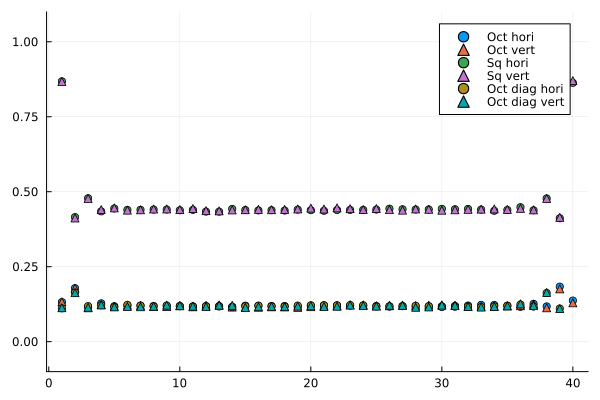

In [81]:
label = ["Oct","Sq", "Oct diag"]
p = plot(ylim=(-0.1,1.1))
for i in 1:3 
    scatter!(hori_data[1][i], label= label[i] .* " hori")
    scatter!(vert_data[1][i], label= label[i] .* " vert", markershape=:^)
end
display(p)

## Szsz

In [82]:
hori_oct_szsz = abs.(hori_data[2][1] .- hori_data[1][1] * hori_data[1][1][origin])
hori_sq_szsz = abs.(hori_data[2][2] .- hori_data[1][2] * hori_data[1][2][origin])
hori_oct_diag_szsz = abs.(hori_data[2][3] .- hori_data[1][3] * hori_data[1][3][origin]);

vert_oct_szsz = abs.(vert_data[2][1] .- vert_data[1][1] * vert_data[1][1][origin])
vert_sq_szsz = abs.(vert_data[2][2] .- vert_data[1][2] * vert_data[1][2][origin])
vert_oct_diag_szsz = abs.(vert_data[2][3] .- vert_data[1][3] * vert_data[1][3][origin]);


d_oct = abs.([i - origin for i in 1:length(oct_path)])
d_sq = abs.([i - origin for i in 1:length(sq_path)])
d_oct_diag = abs.([i - origin for i in 1:length(oct_diag_path)])
;

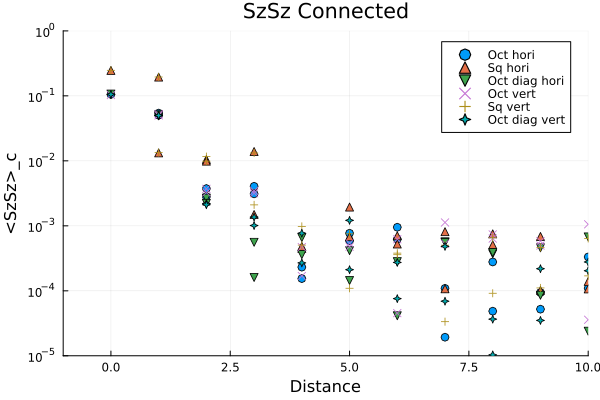

In [83]:
p = plot(yaxis=:log, ylims=(1e-5, 1e0),xlim=(-1,10), title="SzSz Connected", xlabel="Distance", ylabel="<SzSz>_c")

scatter!(d_oct, hori_oct_szsz, label="Oct hori", markershape=:o)
scatter!(d_sq, hori_sq_szsz, label="Sq hori", markershape=:^)
scatter!(d_oct_diag, hori_oct_diag_szsz, label="Oct diag hori", markershape=:v)

scatter!(d_oct, vert_oct_szsz, label="Oct vert", markershape=:x)
scatter!(d_sq, vert_sq_szsz, label="Sq vert", markershape=:+)
scatter!(d_oct_diag, vert_oct_diag_szsz, label="Oct diag vert", markershape=:star4)



## Vison

In [85]:
hori_oct_vis_left = abs.(hori_data[3][1])
hori_oct_vis_right = abs.(hori_data[4][1])
hori_sq1_vis_left = abs.(hori_data[3][2])
hori_sq1_vis_right = abs.(hori_data[4][2])
hori_sq2_vis_left = abs.(hori_data[3][3])
hori_sq2_vis_right = abs.(hori_data[4][3])
hori_oct_diag_vis_left = abs.(hori_data[3][4])
hori_oct_diag_vis_right = abs.(hori_data[4][4])

vert_oct_vis_left = abs.(vert_data[3][1])
vert_oct_vis_right = abs.(vert_data[4][1])
vert_sq1_vis_left = abs.(vert_data[3][2])
vert_sq1_vis_right = abs.(vert_data[4][2])
vert_sq2_vis_left = abs.(vert_data[3][3])
vert_sq2_vis_right = abs.(vert_data[4][3])
vert_oct_diag_vis_left = abs.(vert_data[3][4])
vert_oct_diag_vis_right = abs.(vert_data[4][4])


oct_vis = avg(hori_oct_vis_left, hori_oct_vis_right[1:end-1], vert_oct_vis_left, vert_oct_diag_vis_right)
;

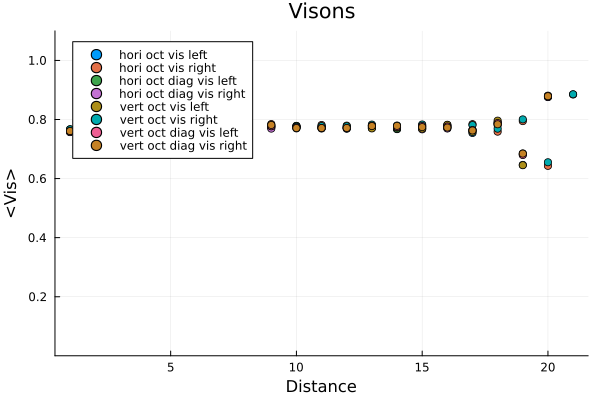

In [86]:
p = plot(ylims=(1e-4, 1.1), title="Visons", xlabel="Distance", ylabel="<Vis>")
scatter!(hori_oct_vis_left, label="hori oct vis left")
scatter!(hori_oct_vis_right, label="hori oct vis right")
# scatter!(hori_sq1_vis_left, label="hori sq1 vis left")
# scatter!(hori_sq1_vis_right, label="hori sq1 vis right")
# scatter!(hori_sq2_vis_left, label="hori sq2 vis left")
# scatter!(hori_sq2_vis_right, label="hori sq2 vis right")
scatter!(hori_oct_diag_vis_left, label="hori oct diag vis left")
scatter!(hori_oct_diag_vis_right, label="hori oct diag vis right")

# Add vertical data to the plot
scatter!(vert_oct_vis_left, label="vert oct vis left")
scatter!(vert_oct_vis_right, label="vert oct vis right")
# scatter!(vert_sq1_vis_left, label="vert sq1 vis left")
# scatter!(vert_sq1_vis_right, label="vert sq1 vis right")
# scatter!(vert_sq2_vis_left, label="vert sq2 vis left")
# scatter!(vert_sq2_vis_right, label="vert sq2 vis right")
scatter!(vert_oct_diag_vis_left, label="vert oct diag vis left")
scatter!(vert_oct_diag_vis_right, label="vert oct diag vis right")

# Display the plot
display(p)

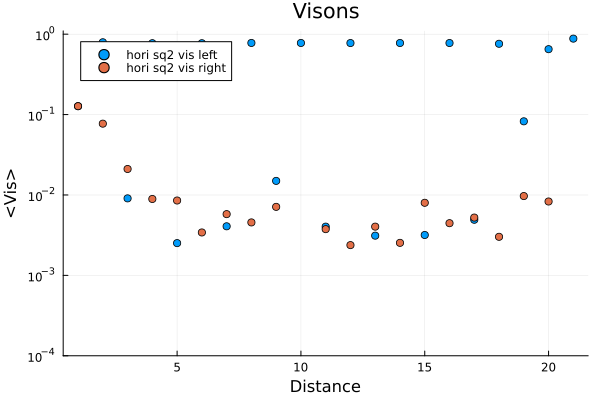

In [87]:
p = plot(yaxis=:log,ylims=(1e-4, 1.1), title="Visons", xlabel="Distance", ylabel="<Vis>")

# scatter!(hori_sq1_vis_left, label="hori sq1 vis left")
# scatter!(hori_sq1_vis_right, label="hori sq1 vis right")
scatter!(hori_sq2_vis_left, label="hori sq2 vis left")
scatter!(hori_sq2_vis_right, label="hori sq2 vis right")


# Add vertical data to the plot

# scatter!(vert_sq1_vis_left, label="vert sq1 vis left")
# scatter!(vert_sq1_vis_right, label="vert sq1 vis right")
# scatter!(vert_sq2_vis_left, label="vert sq2 vis left")
# scatter!(vert_sq2_vis_right, label="vert sq2 vis right")


# Display the plot
display(p)

In [88]:
oct_vis = avg(hori_oct_vis_left, vert_oct_vis_left)
sq1_vis = avg(hori_sq1_vis_left, hori_sq2_vis_right, vert_sq1_vis_left, vert_sq2_vis_right)
sq2_vis = avg(hori_sq1_vis_right, hori_sq2_vis_left, vert_sq1_vis_right, vert_sq2_vis_left)
oct_diag_vis = avg(hori_oct_diag_vis_left,hori_oct_diag_vis_right, vert_oct_diag_vis_left, vert_oct_diag_vis_right)
;

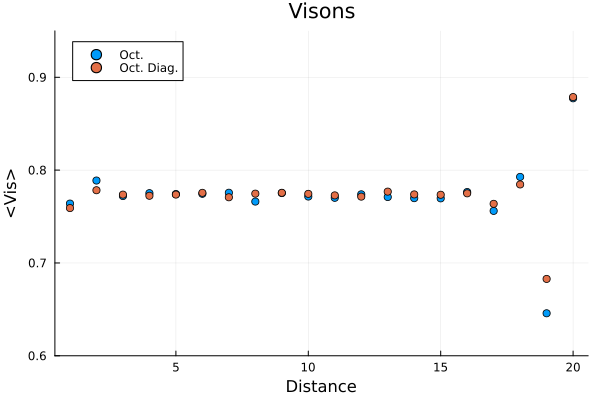

In [89]:
p = plot(ylims=(0.6, 0.95), title="Visons", xlabel="Distance", ylabel="<Vis>")

scatter!(oct_vis, label="Oct.")
scatter!(oct_diag_vis, label="Oct. Diag.")


# Display the plot
display(p)

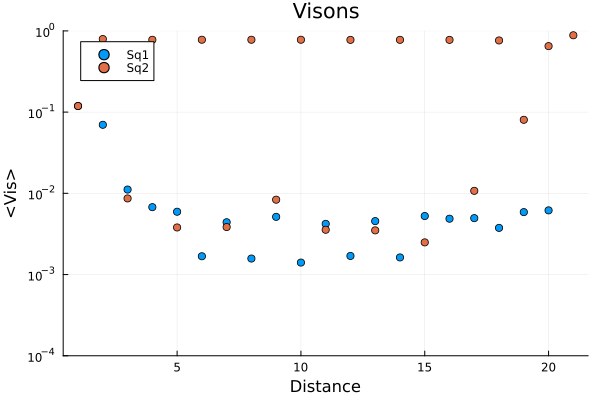

In [90]:
p = plot(yaxis=:log, ylims=(1e-4, 1), title="Visons", xlabel="Distance", ylabel="<Vis>")

scatter!(sq1_vis, label="Sq1")
scatter!(sq2_vis, label="Sq2")


# Display the plot
display(p)

# Order investigation

In [93]:
function mc_move(config::Vector{Bool}, plaq_oct_spin::Matrix{Int64},plaq_sq_spin::Matrix{Int64},noct::Int64, nsq::Int64 )
    # Returns true if move is not done
    # returns false if a move is done
    if rand(Bool)
        return plaq_oct_move(config,plaq_oct_spin, noct )
    else
        return plaq_sq_move(config,plaq_sq_spin, nsq )
    end
    return nothing
end

function generate_configs(initial_config::Vector{Bool}, plaq_oct_spin::Matrix{Int64},plaq_sq_spin::Matrix{Int64}, nsample::Int64)
    Random.seed!(1234)

    noct = size(plaq_oct_spin)[2]
    nsq = size(plaq_sq_spin)[2]

    config_list = [initial_config]

    for i in 1:nsample
        config = deepcopy(config_list[end])
        while !mc_move(config, plaq_oct_spin, plaq_sq_spin, noct, nsq)
        end
        push!(config_list, config)
    end


    return config_list
end

generate_configs (generic function with 1 method)

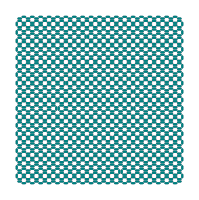

  0.759448 seconds (670.29 k allocations: 39.873 MiB, 0.53% gc time)


In [94]:
p = plot_generate(200)

@time plot_edges(p,so_lat_rect_full)
i = 8
plot_config(p, config_list[i],spin_to_G, so_lat_rect)
plot_config(p, config_list[i+1],spin_to_G, so_lat_rect)
plot!(xticks=false, yticks=false, framestyle=:none)
display(p)

In [95]:
function plot_config(p, config,spin_to_G, so_lat, annotate = false)
    for i in 1:length(config)
        if config[i] == true
            a, b = spin_to_G[i]
            p1, p2 = so_lat.pts[a], so_lat.pts[b] 
            x, y = real.([p1,p2]) ,  imag.([p1, p2])
            plot!(p,x, y , linecolor="teal", linewidth=2)
        end
    end
    if annotate
        scatter!(p, real(pts), imag(pts), mc=:blue, markerstrokewidth=0, series_annotations = text.(1:npts))
    end
    return p
end

function bipartite_sublattices(adj::AbstractMatrix{Bool})
    n = size(adj, 1)
    color = fill(-1, n)  # -1: unvisited, 0: set A, 1: set B

    for start in 1:n
        if color[start] == -1
            queue = [start]
            color[start] = 0

            while !isempty(queue)
                u = popfirst!(queue)
                for v in 1:n
                    if adj[u, v]
                        if color[v] == -1
                            color[v] = 1 - color[u]
                            push!(queue, v)
                        elseif color[v] == color[u]
                            error("Graph is not bipartite")
                        end
                    end
                end
            end
        end
    end

    set_A = findall(x -> x == 0, color)
    set_B = findall(x -> x == 1, color)
    return set_A, set_B
end

A, B = bipartite_sublattices(Matrix{Bool}(so_lat_rect_full.adj))
println("Set A: ", A)
println("Set B: ", B)
sublattice = fill("", length(so_lat_rect_full.pts))
for a in A
    sublattice[a] = "A"
end
for b in B
    sublattice[b] = "B"
end
if "" in sublattice
    error("Not all sites are assigned to a sublattice")
end

function plot_config_4color(p, config,spin_to_G, so_lat, A, B, sublattice)
    cols = ["red", "blue", "green", "orange", "gray"]
    cols = ["red", "blue", "red", "blue", "gray"]
    cols = ["pink", "pink", "pink", "pink", "gray"]
    # Fucntion to assign colors based on the orientation
    # cols[1] for vertical dimers of the form AB
    # cols[2] for vertical dimers of the form BA
    # cols[3] for horizontal dimers of the form AB
    # cols[4] for horizontal dimers of the form BA

    for i in 1:length(config)
        if config[i] == true
            a, b = spin_to_G[i]
            p1, p2 = so_lat.pts[a], so_lat.pts[b] 
            color = "black" # default color
            # Determine the orientation of the dimer
            if abs( real(p1-p2) ) < 1e-5
                # vertical dimers
                top, bottom = a, b
                if imag(p1) < imag(p2)
                    top, bottom = b, a
                end
                # Check the sublattice of the dimer
                if sublattice[top] == "A" && sublattice[bottom] == "B"
                    color = cols[1]
                elseif sublattice[top] == "B" && sublattice[bottom] == "A"
                    color = cols[3]
                end
            
            elseif abs( imag(p1-p2) ) < 1e-5

                left, right = a, b
                if real(p1) > real(p2)
                    left, right = b, a
                end
                if sublattice[left] == "A" && sublattice[right] == "B"
                    color = cols[4]
                elseif sublattice[left] == "B" && sublattice[right] == "A"
                    color = cols[2]
                end
            else
                color = cols[5]
            end

            x, y = real.([p1,p2]) ,  imag.([p1, p2])
            plot!(p,x, y , linecolor=color, linewidth=4.5)
        end
    end
    pts = so_lat.pts
    return p
end

function nflip_plaq(config::Vector{Bool}, plaq_oct_spin::Matrix{Int64},plaq_sq_spin::Matrix{Int64})
    noct = size(plaq_oct_spin)[2]
    nsq = size(plaq_sq_spin)[2]
    nflip_oct = 0
    nflip_sq = 0
    for p in 1:noct
        s1, s2, s3, s4, s5, s6, s7, s8 = config[plaq_oct_spin[:,p]]
        if s1 == s2 || s2 == s3 || s3 == s4 || s4 == s5 || s5 == s6 || s6 == s7 || s7 == s8 || s8 == s1
            nflip_oct = nflip_oct + 1
        end 
    end
    for p in 1:nsq
        s1, s2, s3, s4 = config[plaq_sq_spin[:,p]]
        if s1 == s2 || s2 == s3 || s3 == s4 || s4 == s1
            nflip_sq = nflip_sq + 1
        end 
    end
    return [nflip_oct,  noct, nflip_sq, nsq]
end

Set A: [1, 4, 6, 7, 9, 12, 14, 15, 17, 20, 22, 23, 25, 28, 30, 31, 33, 36, 38, 39, 41, 44, 46, 47, 49, 52, 54, 55, 57, 60, 62, 63, 65, 68, 70, 71, 73, 76, 78, 79, 81, 84, 86, 87, 89, 92, 94, 95, 97, 100, 102, 103, 105, 108, 110, 111, 113, 116, 118, 119, 121, 124, 126, 127, 129, 132, 134, 135, 137, 140, 142, 143, 145, 148, 150, 151, 153, 156, 158, 159, 161, 164, 166, 167, 169, 172, 174, 175, 177, 180, 182, 183, 185, 188, 190, 191, 193, 196, 198, 199, 201, 204, 206, 207, 209, 212, 214, 215, 217, 220, 222, 223, 225, 228, 230, 231, 233, 236, 238, 239, 241, 244, 246, 247, 249, 252, 254, 255, 257, 260, 262, 263, 265, 268, 270, 271, 273, 276, 278, 279, 281, 284, 286, 287, 289, 292, 294, 295, 297, 300, 302, 303, 305, 308, 310, 311, 313, 316, 318, 319, 321, 324, 326, 327, 329, 332, 334, 335, 337, 340, 342, 343, 345, 348, 350, 351, 353, 356, 358, 359, 361, 364, 366, 367, 369, 372, 374, 375, 377, 380, 382, 383, 385, 388, 390, 391, 393, 396, 398, 399, 401, 404, 406, 407, 409, 412, 414, 415, 417, 4

nflip_plaq (generic function with 1 method)

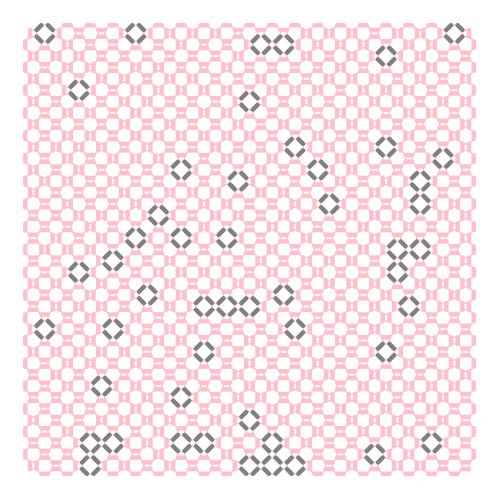

  0.127438 seconds (2 allocations: 128 bytes)


In [96]:
# Randomize configuration

config_vert = get_vert_col_state(so_lat_rect_spin_full, so_lat_rect)
nstep = 1000_000_0
@time rand_config = randomize_config(nstep, config_vert, so_lat_rect_spin.sq_plaq, so_lat_rect_spin.oct_plaq)
;
p = plot_generate(500)
# plot_graph(p,so_lattice, "pink",  2, :green)
plot_edges(p,so_lat_rect_full, "pink", 1.5)
# plot_edges(p,so_lat_spin,"green")
config_hori = get_hori_col_state(so_lat_rect_spin, so_lat_rect)
plot_config_4color(p, rand_config,spin_to_G, so_lat_rect_full, A, B, sublattice)
plot!(xticks=false, yticks=false, framestyle=:none)
savefig(p, "../images/sor-random-config.pdf")
display(p)
;